In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from keras.applications.vgg19 import VGG19
import pandas as pd
import numpy as np
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Conv2D,Flatten,Dropout,MaxPool2D,Dense

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [3]:
trainpath = '../input/seg_train/'
testpath = '../input/seg_test/'
predpath = '../input/seg_pred/'


In [4]:
for folder in os.listdir(trainpath + 'seg_train'):
    files = gb.glob(pathname= str(trainpath + 'seg_train//'+folder+'/*.jpg'))
    print(f"for training data, found {len(files)} in folder {folder}")

for training data, found 2191 in folder buildings
for training data, found 2271 in folder forest
for training data, found 2404 in folder glacier
for training data, found 2512 in folder mountain
for training data, found 2274 in folder sea
for training data, found 2382 in folder street


In [5]:
files = gb.glob(pathname= str(predpath + 'seg_pred'+'/*.jpg'))
print(f"for predicting data, found {len(files)} image")

for predicting data, found 7301 image


In [6]:
codes = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(c):
    for key, val in codes.items():
        if c == val:
            return key

In [7]:
size = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(111, 150, 3)        3
(135, 150, 3)        3
(144, 150, 3)        2
(123, 150, 3)        2
(142, 150, 3)        2
(146, 150, 3)        2
(143, 150, 3)        2
(134, 150, 3)        2
(136, 150, 3)        2
(108, 150, 3)        2
(105, 150, 3)        1
(97, 150, 3)         1
(131, 150, 3)        1
(147, 150, 3)        1
(81, 150, 3)         1
(145, 150, 3)        1
(141, 150, 3)        1
(100, 150, 3)        1
(103, 150, 3)        1
(76, 150, 3)         1
(120, 150, 3)        1
(102, 150, 3)        1
(119, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(124, 150, 3)        1
(110, 150, 3)        1
(149, 150, 3)        1
(140, 150, 3)        1
Name: count, dtype: int64

In [8]:
size = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(141, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(149, 150, 3)       1
(72, 150, 3)        1
(131, 150, 3)       1
(81, 150, 3)        1
Name: count, dtype: int64

In [9]:
size=[]
files = gb.glob(pathname= str(predpath + 'seg_pred'+'/*.jpg'))
for file in files:
    image=cv2.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(133, 150, 3)       1
(139, 150, 3)       1
(108, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
(144, 150, 3)       1
(149, 150, 3)       1
(143, 150, 3)       1
(129, 150, 3)       1
(100, 150, 3)       1
(112, 150, 3)       1
(126, 150, 3)       1
(374, 500, 3)       1
Name: count, dtype: int64

In [10]:
s = 100

In [11]:
x_train=[]
y_train=[]

for folder in os.listdir(trainpath+'seg_train'):
    files= gb.glob(pathname=str(trainpath+'seg_train//'+folder+'/*.jpg'))
    for file in files:
        image=cv2.imread(file)
        image_array=cv2.resize(image,(s,s))
        x_train.append(list(image_array))
        y_train.append(codes[folder])

In [12]:
print(f'we have {len(x_train)} items in X_train')

we have 14034 items in X_train


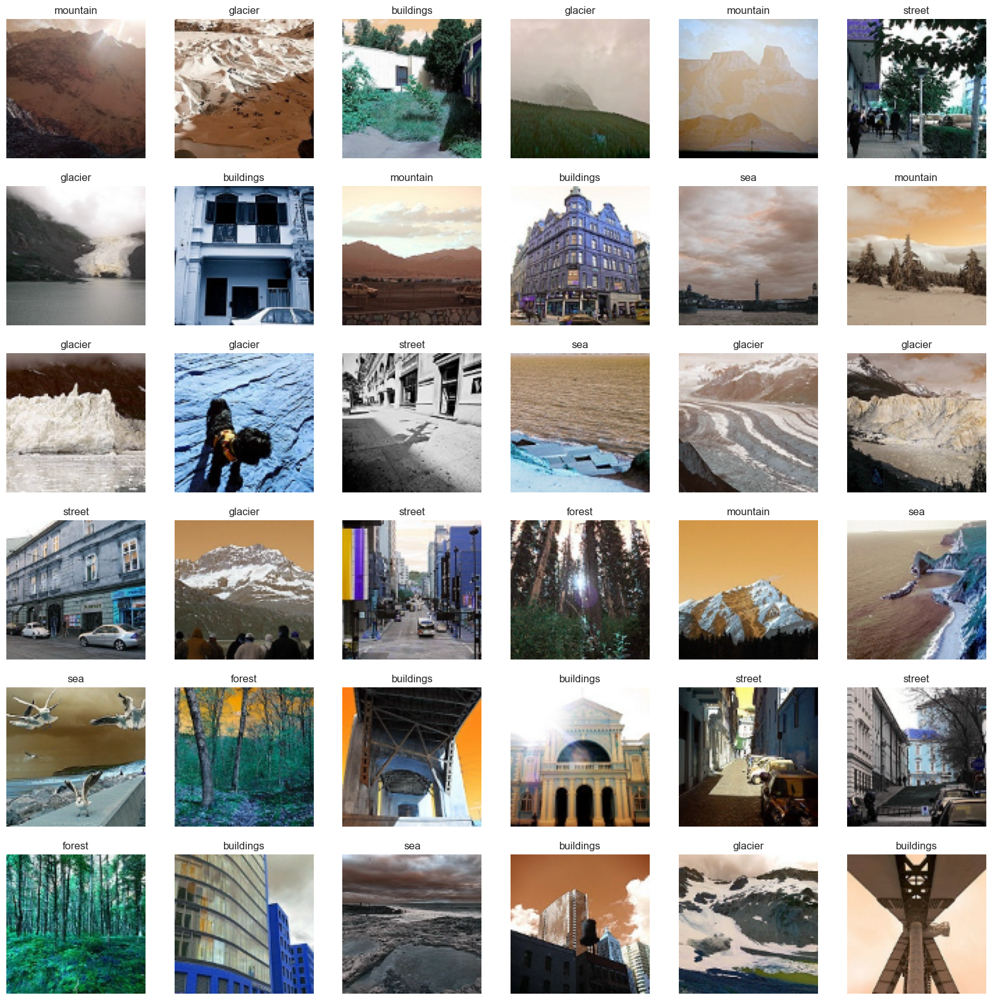

In [13]:
plt.figure(figsize=(20,20))
for n, i in enumerate(list(np.random.randint(0,len(x_train),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_train[i])
    plt.title(getcode(y_train[i]))
    plt.axis('off')

In [14]:
x_test=[]
y_test=[]

for folder in os.listdir(testpath+'seg_test'):
    files= gb.glob(pathname=str(testpath+'seg_test//'+folder+'/*.jpg'))
    for file in files:
        image=cv2.imread(file)
        image_array=cv2.resize(image,(s,s))
        x_test.append(list(image_array))
        y_test.append(codes[folder])

In [15]:
print(f'we have {len(x_test)} items in X_test')

we have 3000 items in X_test


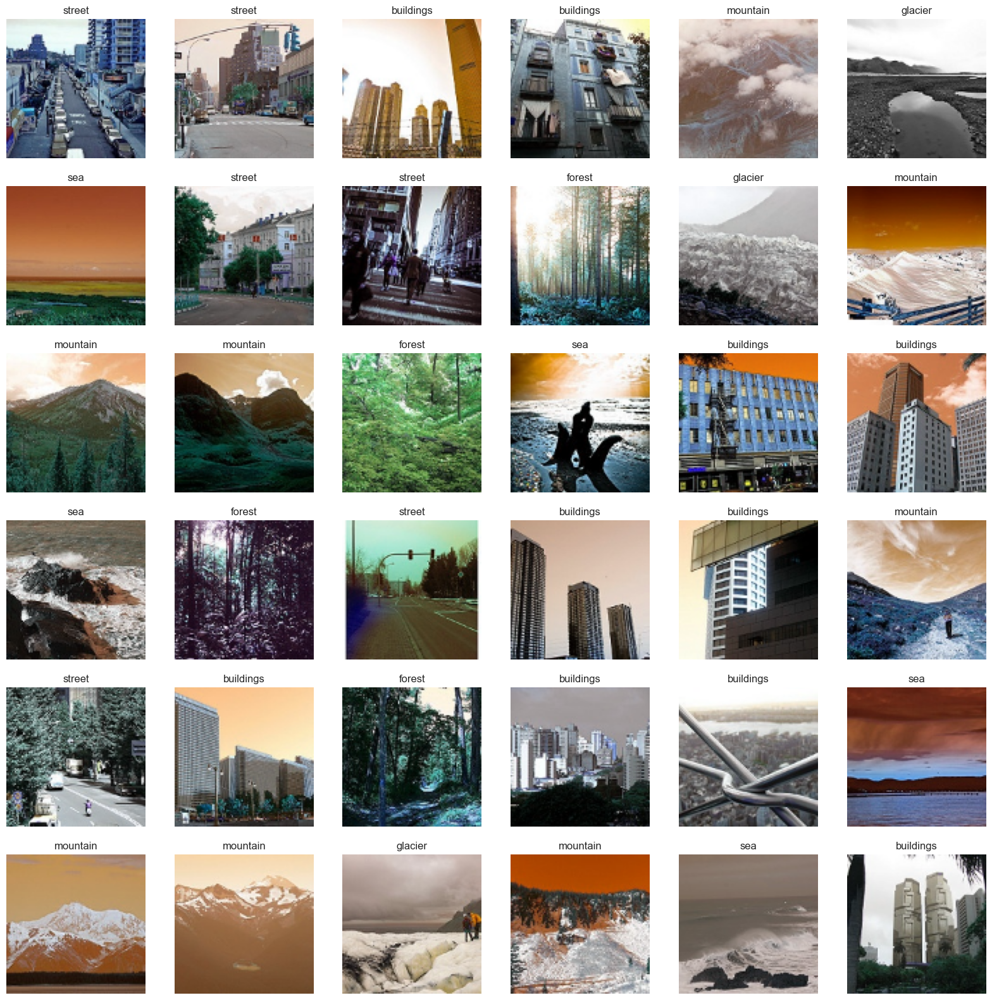

In [16]:
plt.figure(figsize=(20,20))
for n, i in enumerate(list(np.random.randint(0,len(x_test),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_test[i])
    plt.title(getcode(y_test[i]))
    plt.axis('off')

In [17]:
x_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    x_pred.append(list(image_array))    

In [18]:
print(f'we have {len(x_pred)} items in X_pred')

we have 7301 items in X_pred


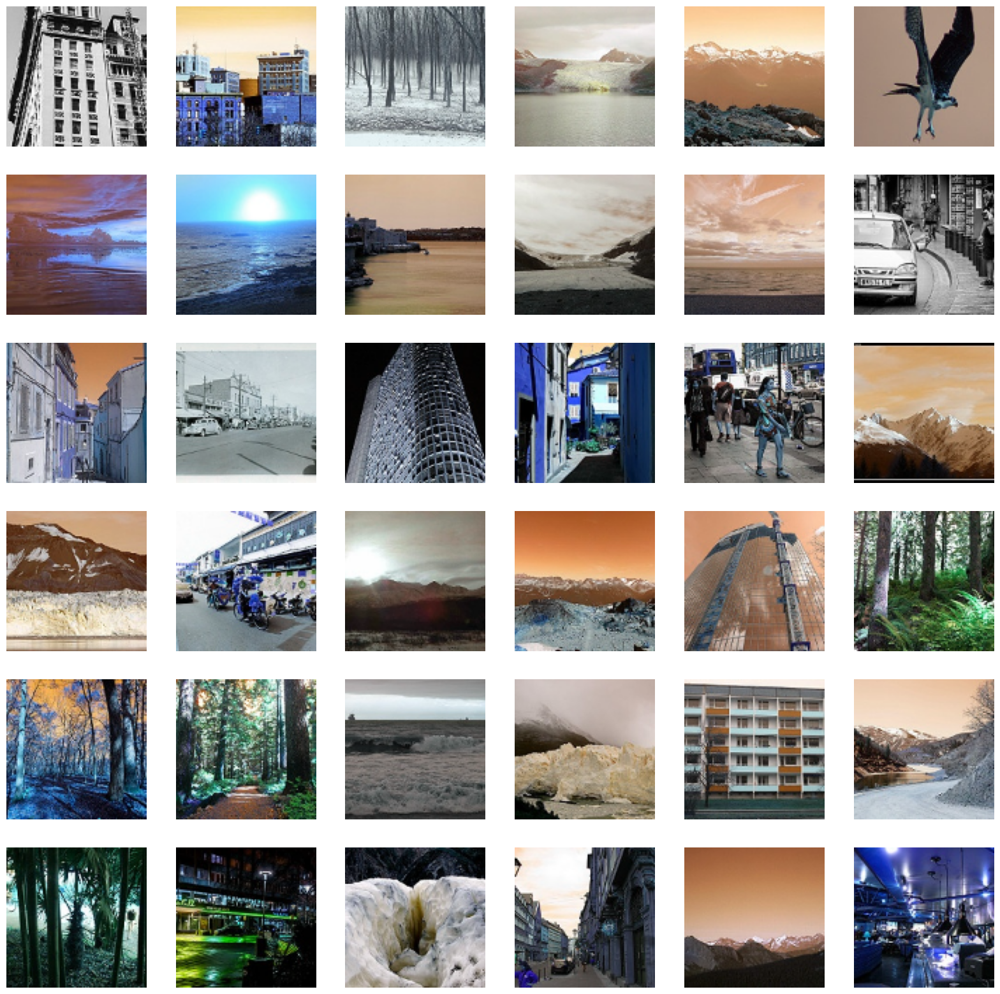

In [19]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])    
    plt.axis('off')

In [20]:
x_train = np.array(x_train)
x_test = np.array(x_test)
x_pred_array = np.array(x_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {x_train.shape}')
print(f'X_test shape  is {x_test.shape}')
print(f'X_pred shape  is {x_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


In [21]:
model = Sequential([
        Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        Conv2D(150,kernel_size=(3,3),activation='relu'),
        MaxPool2D(4,4),
        Conv2D(120,kernel_size=(3,3),activation='relu'),    
        Conv2D(80,kernel_size=(3,3),activation='relu'),    
        Conv2D(50,kernel_size=(3,3),activation='relu'),
        MaxPool2D(4,4),
        Flatten() ,    
        Dense(120,activation='relu') ,    
        Dense(100,activation='relu') ,    
        Dense(50,activation='relu') ,        
        Dropout(rate=0.5) ,            
        Dense(6,activation='softmax') ,    
        ])

In [22]:

model.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [23]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 200)       5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 150)      0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_3 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_4 (Conv2D)           (None, 18, 18, 50)        36050     
                                   

In [24]:
epochs = 50
keras_model = model.fit(x_train, y_train, epochs=epochs,batch_size=32,verbose=1)

Epoch 1/50
 70/439 [===>..........................] - ETA: 11:11 - loss: 2.3603 - accuracy: 0.1946

: 

: 

In [ ]:
loss, accuracy = model.evaluate(x_test, y_test)

print('Test Loss is {}'.format(loss))
print('Test Accuracy is {}'.format(accuracy ))

In [ ]:
y_pred = model.predict(x_test)

print('Prediction Shape is {}'.format(y_pred.shape))

In [ ]:
y_result = model.predict(x_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

In [ ]:
from keras.applications.mobilenet import MobileNet

from keras.applications.mobilenet import preprocess_input

In [ ]:
x_train = preprocess_input(x_train)
x_test = preprocess_input(x_test)
x_pred_array = preprocess_input(x_pred_array)

In [ ]:
x_train.shape

In [ ]:
mobilenet_model = MobileNet(weights='imagenet',include_top=False,input_shape=(100,100,3))

In [ ]:
mobilenet_model.summary()

In [ ]:
# Freeze all layers in the base model
for layer in mobilenet_model.layers:
    layer.trainable = False

In [ ]:
mobilenet_model.output_shape[1:]

In [ ]:
# Add your custom head to the base model
head_model = Sequential()
head_model.add(Flatten(input_shape=mobilenet_model.output_shape[1:]))
head_model.add(Dense(512, activation='relu'))
head_model.add(Dropout(0.3))
head_model.add(Dense(256, activation='relu'))
head_model.add(Dense(6, activation='softmax'))

In [ ]:
# Combine the base model and the head model
mob_model = Sequential()
mob_model.add(mobilenet_model)
mob_model.add(head_model)

In [ ]:
mob_model.summary()

In [ ]:
# Compile the model
mob_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
batch_size=64
epochs=50
history= mob_model.fit(x_train,
                       y_train,
                       epochs=epochs,
                       batch_size=batch_size,
                       validation_data = (x_test,y_test),
                       verbose=1)

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()